# Import Libraries

In [77]:
#Resources: https://github.com/HonglinChu/SiamTrackers
#Import libraries
import matplotlib.pyplot as plt 
from PIL import Image
import subprocess

# Pre-processing Data

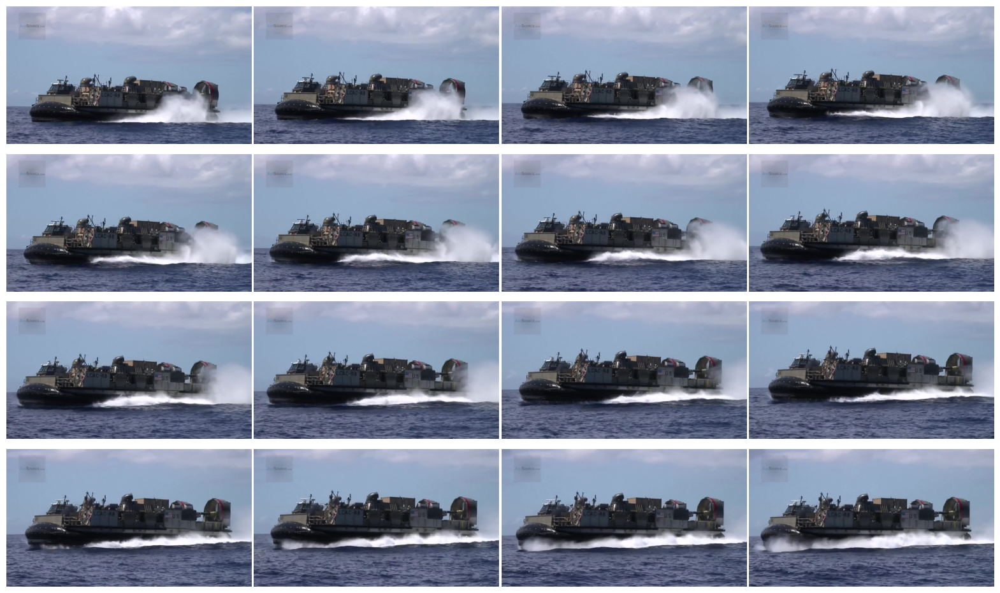

In [72]:
#Plot images function
def plotImages(image_path, columns, rows, start_image):
    fig = plt.figure(figsize=(20, 12))
    for i in range(1, columns*rows +1):
        #C:\Users\LenovoPC\Desktop\SiamTrackers-master\NanoTrack\data\GOT-10k\train\GOT-10k_Train_000093\00000001.jpg
        img = Image.open(image_path + "\\" + str(i).zfill(8) + ".jpg")
        fig.add_subplot(rows, columns, i)
        plt.subplots_adjust(wspace=0.01) # set the horizontal space between images
        plt.subplots_adjust(hspace=0.01) # set the vertical space between images
        plt.imshow(img)
        plt.axis('off')
    plt.show()

plotImages("./data/GOT-10k/train/GOT-10k_Train_000093", 4, 4, 1)

In [75]:
#Pre-processing Data 

#function to run a python script and display the output
def run_script(script_path, *args):
    process = subprocess.Popen(
        ["python", script_path],
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE,
        text=True,
        bufsize=1,
        universal_newlines=True
    )

    for stdout_line in iter(process.stdout.readline, ""):
        print(stdout_line, end="")  # Print each line as it is received

    process.stdout.close()
    process.wait()

    if process.returncode != 0:
        for stderr_line in iter(process.stderr.readline, ""):
            print(stderr_line, end="")  # Print stderr if there are errors
        process.stderr.close()

def run_script2(script_path, *args):
    command = ["python", script_path] + list(args)
    process = subprocess.Popen(
        command,
        stdout=subprocess.PIPE,
        stderr=subprocess.PIPE,
        text=True,
        bufsize=1,
        universal_newlines=True
    )

    for stdout_line in iter(process.stdout.readline, ""):
        print(stdout_line, end="")  # Print each line as it is received

    process.stdout.close()
    process.wait()

    if process.returncode != 0:
        for stderr_line in iter(process.stderr.readline, ""):
            print(stderr_line, end="")  # Print stderr if there are errors
        process.stderr.close()

In [5]:
# Run the script
run_script("parse_got10k.py")

subset: train video id: 0000 / 9335
subset: train video id: 0001 / 9335
subset: train video id: 0002 / 9335
subset: train video id: 0003 / 9335
subset: train video id: 0004 / 9335
subset: train video id: 0005 / 9335
subset: train video id: 0006 / 9335
subset: train video id: 0007 / 9335
subset: train video id: 0008 / 9335
subset: train video id: 0009 / 9335
subset: train video id: 0010 / 9335
subset: train video id: 0011 / 9335
subset: train video id: 0012 / 9335
subset: train video id: 0013 / 9335
subset: train video id: 0014 / 9335
subset: train video id: 0015 / 9335
subset: train video id: 0016 / 9335
subset: train video id: 0017 / 9335
subset: train video id: 0018 / 9335
subset: train video id: 0019 / 9335
subset: train video id: 0020 / 9335
subset: train video id: 0021 / 9335
subset: train video id: 0022 / 9335
subset: train video id: 0023 / 9335
subset: train video id: 0024 / 9335
subset: train video id: 0025 / 9335
subset: train video id: 0026 / 9335
subset: train video id: 0027

In [17]:
run_script2("par_crop.py", "511", "16")


train |----------------------------------------| 0.0% Done 
train |----------------------------------------| 0.0% Done 
train |----------------------------------------| 0.0% Done 
train |----------------------------------------| 0.0% Done 
train |----------------------------------------| 0.0% Done 
train |----------------------------------------| 0.1% Done 
train |----------------------------------------| 0.1% Done 
train |----------------------------------------| 0.1% Done 
train |----------------------------------------| 0.1% Done 
train |----------------------------------------| 0.1% Done 
train |----------------------------------------| 0.1% Done 
train |----------------------------------------| 0.1% Done 
train |----------------------------------------| 0.1% Done 
train |----------------------------------------| 0.1% Done 
train |----------------------------------------| 0.1% Done 
train |----------------------------------------| 0.2% Done 
train |--------------------------------

In [18]:
#python gen_json.py
run_script("gen_json.py")

loading json (raw got10k info), please wait 20 seconds~
done!


# Training
### Once training is finished, update the best model in the pre-trained folder

In [1]:
!python ./bin/train.py

[2024-06-29 05:52:49,644-rk0-train.py#249] init done
/home/abdulbhutta/anaconda3/envs/pytorch3.8/lib/python3.8/subprocess.py:848: RuntimeWarning: line buffering (buffering=1) isn't supported in binary mode, the default buffer size will be used
  self.stdout = io.open(c2pread, 'rb', bufsize)
/bin/sh: 1: git: not found
/bin/sh: 1: git: not found
[2024-06-29 05:52:49,667-rk0-train.py#262] Version Information: 
commit : 
  log  : 

[2024-06-29 05:52:49,667-rk0-train.py#263] config 
{
    "META_ARC": "nanotrack",
    "CUDA": true,
    "TRAIN": {
        "NEG_NUM": 16,
        "POS_NUM": 16,
        "TOTAL_NUM": 64,
        "EXEMPLAR_SIZE": 127,
        "SEARCH_SIZE": 255,
        "BASE_SIZE": 7,
        "OUTPUT_SIZE": 16,
        "RESUME": "",
        "PRETRAINED": "",
        "LOG_DIR": "./logs",
        "SNAPSHOT_DIR": "./models/snapshot",
        "EPOCH": 50,
        "START_EPOCH": 0,
        "NUM_CONVS": 4,
        "BATCH_SIZE": 32,
        "NUM_WORKERS": 8,
        "MOMENTUM": 0.9,
   

In [6]:
!tensorboard --logdir=./output

TensorFlow installation not found - running with reduced feature set.

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.14.0 at http://localhost:6006/ (Press CTRL+C to quit)


# Test Data

In [56]:
!python ./bin/test.py

Namespace(config='./models/config/configv1.yaml', dataset='GOT-10k', gpu_id='not_set', num=4, save_path='./results', show_video_level=False, snapshot='models/pretrained/nanotrackv1.pth', tracker_name='nanotrack', tracker_path='./results', video='', vis=False)
root:  ./data\GOT-10k
args.dataset:  GOT-10k
tracker name:  nanotrack
Tracker Path:  ./results
Initializing GOT-10k experiment...
Root directory: c:\Users\LenovoPC\Desktop\SiamTrackers-master\NanoTrack\data\GOT-10k
Subset: val
list_file: c:\Users\LenovoPC\Desktop\SiamTrackers-master\NanoTrack\data\GOT-10k\val\list.txt
Evaluating nanotrack
Saving success plots to reports\GOT-10k\nanotrack\success_plot.png
ao:0.607 --sr:0.733 -speed:99.586



loading GOT-10k: 100%|███████████████████████| 180/180 [00:01<00:00, 127.39it/s, GOT-10k_Val_000180]

0it [00:00, ?it/s]
1it [00:02,  2.49s/it]
2it [00:03,  1.80s/it]
3it [00:05,  1.57s/it]
4it [00:06,  1.34s/it]
5it [00:08,  1.79s/it]
6it [00:10,  1.79s/it]
7it [00:12,  1.79s/it]
8it [00:15,  2.32s/it]
9it [00:19,  2.65s/it]
10it [00:22,  2.90s/it]
11it [00:25,  2.87s/it]
12it [00:27,  2.54s/it]
13it [00:27,  2.02s/it]
14it [00:28,  1.66s/it]
15it [00:29,  1.45s/it]
16it [00:30,  1.34s/it]
17it [00:32,  1.55s/it]
18it [00:34,  1.60s/it]
19it [00:36,  1.82s/it]
20it [00:37,  1.50s/it]
21it [00:38,  1.28s/it]
22it [00:39,  1.14s/it]
23it [00:39,  1.01it/s]
24it [00:41,  1.26s/it]
25it [00:42,  1.13s/it]
26it [00:43,  1.01it/s]
27it [00:45,  1.50s/it]
28it [00:48,  1.72s/it]
29it [00:50,  1.90s/it]
30it [00:52,  1.93s/it]
31it [00:53,  1.63s/it]
32it [00:55,  1.63s/it]
33it [00:56,  1.65s/it]
34it [00:58,  1.58s/it]
35it [00:58,  1.34s/it]
36it [01:01,  1.55s/it]
37it [01:02,  1.43s/it]

In [78]:
run_script("./bin/eval.py")

root:  ./data\GOT-10k
args.dataset:  GOT-10k
tracker name:  nanotrack
Tracker Path:  ./results
Initializing GOT-10k experiment...
Root directory: c:\Users\LenovoPC\Desktop\SiamTrackers-master\NanoTrack\data\GOT-10k
Subset: val
list_file: c:\Users\LenovoPC\Desktop\SiamTrackers-master\NanoTrack\data\GOT-10k\val\list.txt
Evaluating nanotrack
Saving success plots to reports\GOT-10k\nanotrack\success_plot.png
ao:0.607 --sr:0.733 -speed:99.586


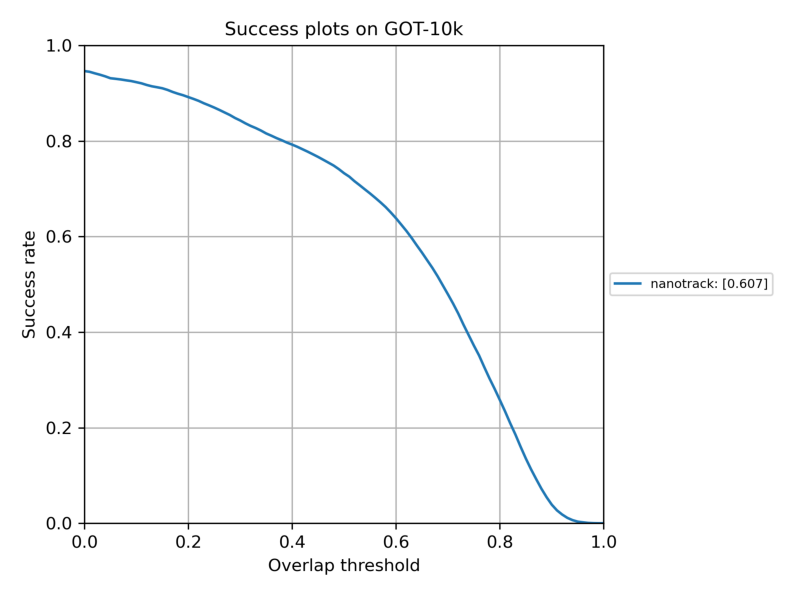

In [73]:
#Plot the image plot.png
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open("reports/GOT-10k/nanotrack/success_plot.png")
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')
plt.show()

# Inference and Tracking

In [93]:
#Convert video into frames
import cv2

def convertFrames(video_path, output_path, fps):
    vidcap = cv2.VideoCapture(video_path)
    success, image = vidcap.read()
    count = 0
    while success:
        vidcap.set(cv2.CAP_PROP_POS_MSEC, (count * 1000 * fps))
        cv2.imwrite(output_path + "/frame%d.jpg" % count, image)
        success, image = vidcap.read()
        count += 1
    print("Frames saved")

convertFrames("./bin/girl_dance.mp4", "./bin/frames_tracking", 0.5)

Frames saved


In [114]:
convertFrames("./bin/_tracking.mp4", "./bin/frames_tracking_object1", 0.5)
convertFrames("./bin/_tracking2.mp4", "./bin/frames_tracking_object2", 0.5)

Frames saved


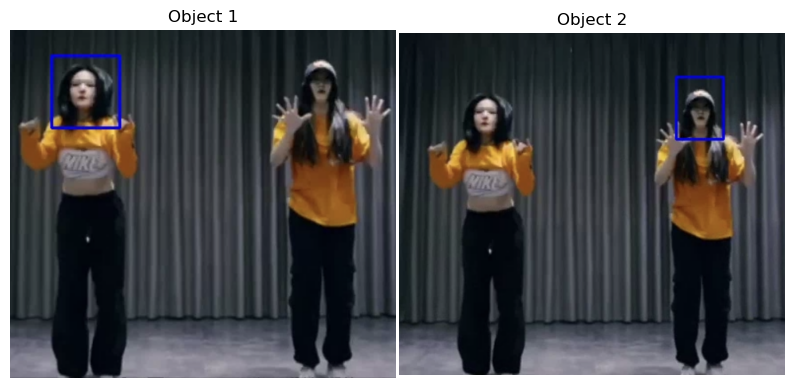

In [51]:
#display object 1 and 2 image side by side using Image module
img1 = Image.open("./bin/objects/Object1.png")
img2 = Image.open("./bin/objects/Object2.png")

fig = plt.figure(figsize=(10, 10))
fig.add_subplot(1, 2, 1)
plt.imshow(img1)
plt.subplots_adjust(hspace=0.01)
plt.title("Object 1")
plt.axis('off')

fig.add_subplot(1, 2, 2)
plt.imshow(img2)
plt.subplots_adjust(wspace=0.01) 
plt.subplots_adjust(hspace=0.1)
plt.title("Object 2")
plt.axis('off')

plt.show()

In [52]:
def plotImages(image_path, columns, rows, start_image):
    fig = plt.figure(figsize=(20, 12))
    for i in range(1, columns*rows +1):
        img = Image.open(image_path + "/frame%i.jpg" % (start_image + i))
        fig.add_subplot(rows, columns, i)
        plt.subplots_adjust(wspace=0.01) # set the horizontal space between images
        plt.subplots_adjust(hspace=0.01) # set the vertical space between images
        plt.imshow(img)
        plt.axis('off')
    plt.show()

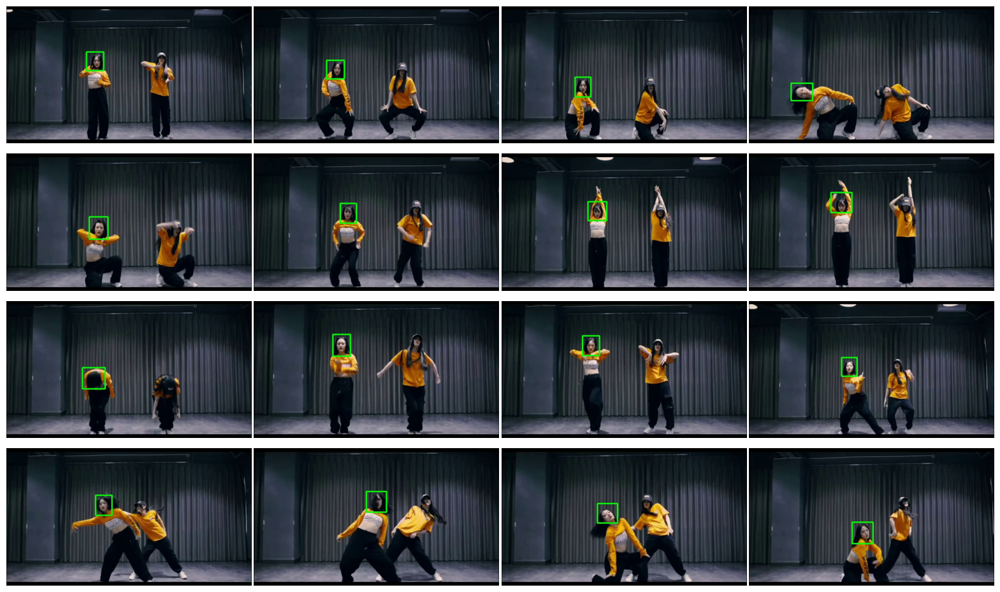

In [53]:
#Object Tracking for Object 1
plotImages("./bin/frames_tracking_object1", 4, 4, 1)

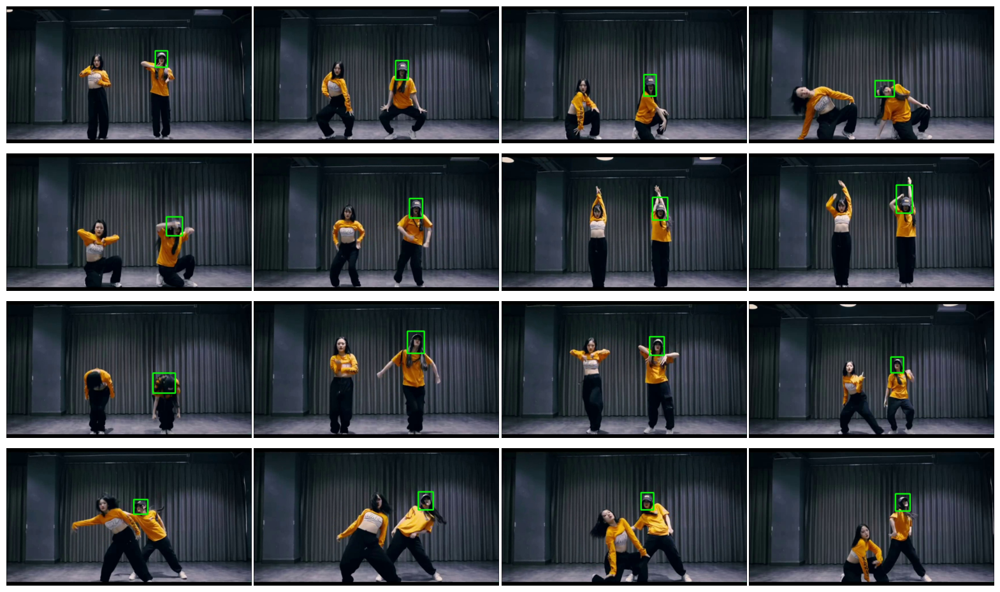

In [54]:
#Object Tracking for Object 2
plotImages("./bin/frames_tracking_object2", 4, 4, 1)

# Occlusion

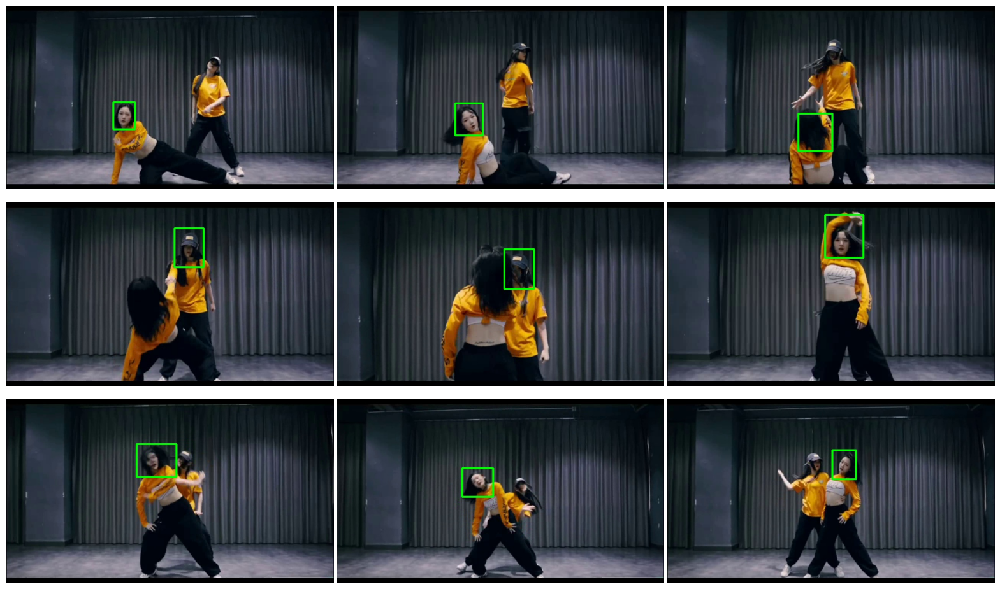

In [55]:
#Occlusion for Object 1
plotImages("./bin/frames_tracking_object1", 3, 3, 19)

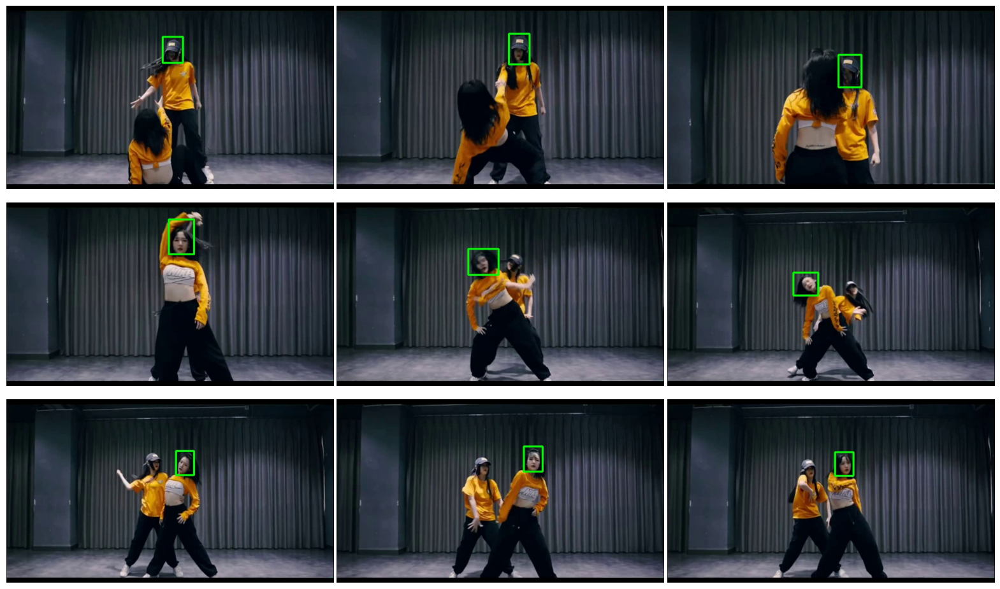

In [56]:
#Occlusion for Object 2
plotImages("./bin/frames_tracking_object2", 3, 3, 21)